# Warning :
# Do "File -> Save a copy in Drive" before you start modifying the notebook, otherwise your modifications will not be saved.


Avant de commencer le TP, vérifiez que vous êtes sur un environnement GPU et python 3 :

Exécution -> Modifier le type d'exécution -> Type d'exécution = python2, Accélerateur matériel = GPU

In [ ]:
import argparse
import os
import time

import PIL
from PIL import Image

import numpy as np
import torchvision
import pickle

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.utils.data
import torchvision.datasets as datasets
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torch.autograd import Variable
import torch.nn.functional as F
from sklearn.svm import LinearSVC
from torch.utils.data import DataLoader

# Partie 1 : Architecture VGG16

In [ ]:
#!wget https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp8/imagenet_classes.pkl
!wget https://github.com/rdfia/rdfia.github.io/raw/master/data/3-a/imagenet_classes.pkl

# Bonus : Classifiez des exemples avec vgg16 et commentez le résultat dans votre rapport.
!wget --content-disposition https://unsplash.com/photos/gKXKBY-C-Dk/download?force=true -O cat.jpg
!wget --content-disposition https://unsplash.com/photos/qO-PIF84Vxg/download?force=true -O dog.jpg

--2023-12-27 17:23:53--  https://github.com/rdfia/rdfia.github.io/raw/master/data/3-a/imagenet_classes.pkl
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-a/imagenet_classes.pkl [following]
--2023-12-27 17:23:54--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-a/imagenet_classes.pkl
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35454 (35K) [text/plain]
Saving to: ‘imagenet_classes.pkl.5’

imagenet_classes.pk 100%[===================>]  34.62K  --.-KB/s    in 0.003s  

2023-12-27 17:23:54 (13.3 MB/s) - ‘imagenet_classes.pkl.5’ saved [3

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


predicted class is wire-haired fox terrier with probabilty of: 21.8%


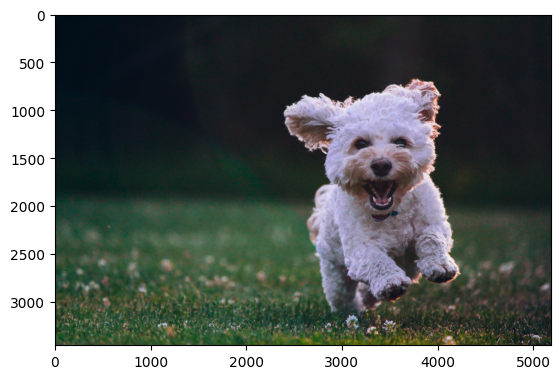

In [ ]:
cat = Image.open('cat.jpg')
dog = Image.open('dog.jpg')
plt.imshow(cat)
plt.imshow(dog)
# Ajoutez vos images
# VOTRE CODE ICI pour le bonus:

vgg16 = torchvision.models.vgg16(pretrained=True)
vgg16.eval()
imagenet_classes = pickle.load(open('imagenet_classes.pkl', 'rb')) # chargement des classes

img = Image.open("dog.jpg")
img = img.resize((224, 224), Image.BILINEAR)
img = np.array(img, dtype=np.float32) / 255
img = img.transpose((2, 0, 1))

#preprocess image (normalization)
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
img[0,:,:] = (img[0,:,:] - mean[0])/std[0]
img[1,:,:] = (img[1,:,:] - mean[1])/std[1]
img[2,:,:] = (img[2,:,:] - mean[2])/std[2]
img = np.expand_dims(img, 0)
x = torch.Tensor(img)


prediction = vgg16(x).softmax(1)
class_id = prediction.argmax(1).item()
score = prediction[0,class_id].item()
category_name = imagenet_classes[class_id]
print(f"predicted class is {category_name} with probabilty of: {100 * score:.1f}%")

### Bonus : Apply the network on several images of your choice and comment on the results.

In [ ]:
#!tar -xzvf dir_image.tar.gz

In [ ]:
dir = "dir_image"

In [ ]:
import matplotlib.pyplot as plt

def function_for_bonus_1(model,dir):
  # Define the transformation to resize the images directly to 224x224 and apply necessary transformations
  transform = transforms.Compose([
    transforms.Resize((224, 224),Image.BILINEAR),  # Resize directly to 224x224 pixels
    transforms.ToTensor(),          # Convert the image to a PyTorch Tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize with ImageNet's mean and std
                         std=[0.229, 0.224, 0.225])
  ])


  file_list = []

  # Parcourir le répertoire
  for filename in os.listdir(dir):
    f=os.path.join(dir, filename)
    if os.path.isfile(f):
        file_list.append(f)

  nrows =len(os.listdir(dir))/2 if len(os.listdir(dir))%2==0  else len(os.listdir(dir))//2 +1
  ncols=2

  fig, axs = plt.subplots(nrows, ncols, figsize=(4*nrows, 12))
  fig.subplots_adjust(wspace=0.4, hspace=0.6)

  axs=axs.flatten()


  for i,f in enumerate(file_list):
      img = Image.open(f)
      axs[i].imshow(img)
      img = transform(img)
      img = img.unsqueeze(0)


      prediction = vgg16(img).softmax(1)
      class_id = prediction.argmax(1).item()
      score = prediction[0,class_id].item()
      category_name = imagenet_classes[class_id]
      axs[i].set_title(f"predicted class is {category_name} with probabilty of: {100 * score:.1f}%")

  for j in range(i+1,nrows * ncols):
      axs.flat[j].set_visible(False)


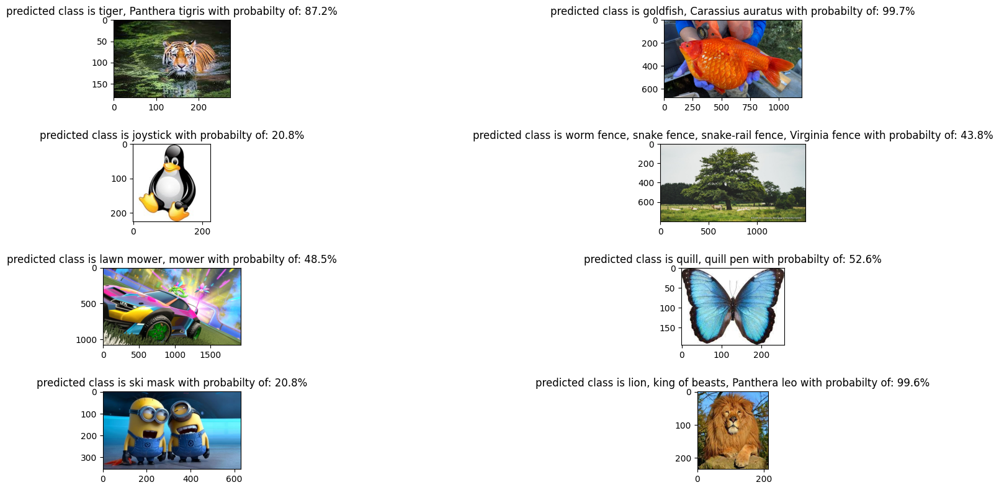

In [ ]:
function_for_bonus_1(vgg16,dir)

### Bonus : visualization

In [ ]:
vgg16.features

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

In [ ]:
vgg16.classifier

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)

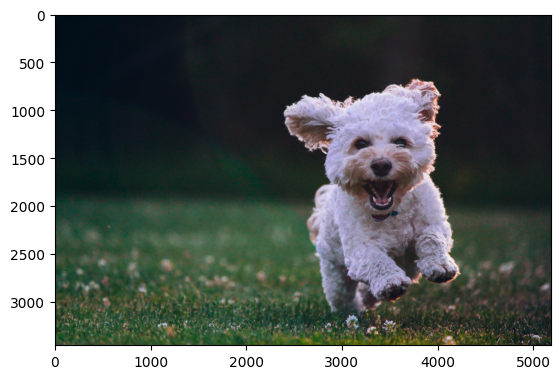

In [ ]:
dog = Image.open('dog.jpg')
plt.imshow(dog)

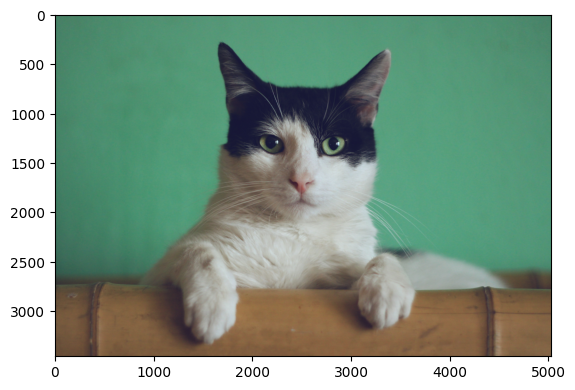

In [ ]:
cat = Image.open('cat.jpg')
plt.imshow(cat)

In [ ]:
vgg16.eval()  # Set the model to evaluation mode

transform = transforms.Compose([
    transforms.Resize((224, 224),Image.BILINEAR),  # Resize directly to 224x224 pixels
    transforms.ToTensor(),          # Convert the image to a PyTorch Tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize with ImageNet's mean and std
                         std=[0.229, 0.224, 0.225])
  ])

##### first conv

In [ ]:
first_conv=vgg16.features[0]

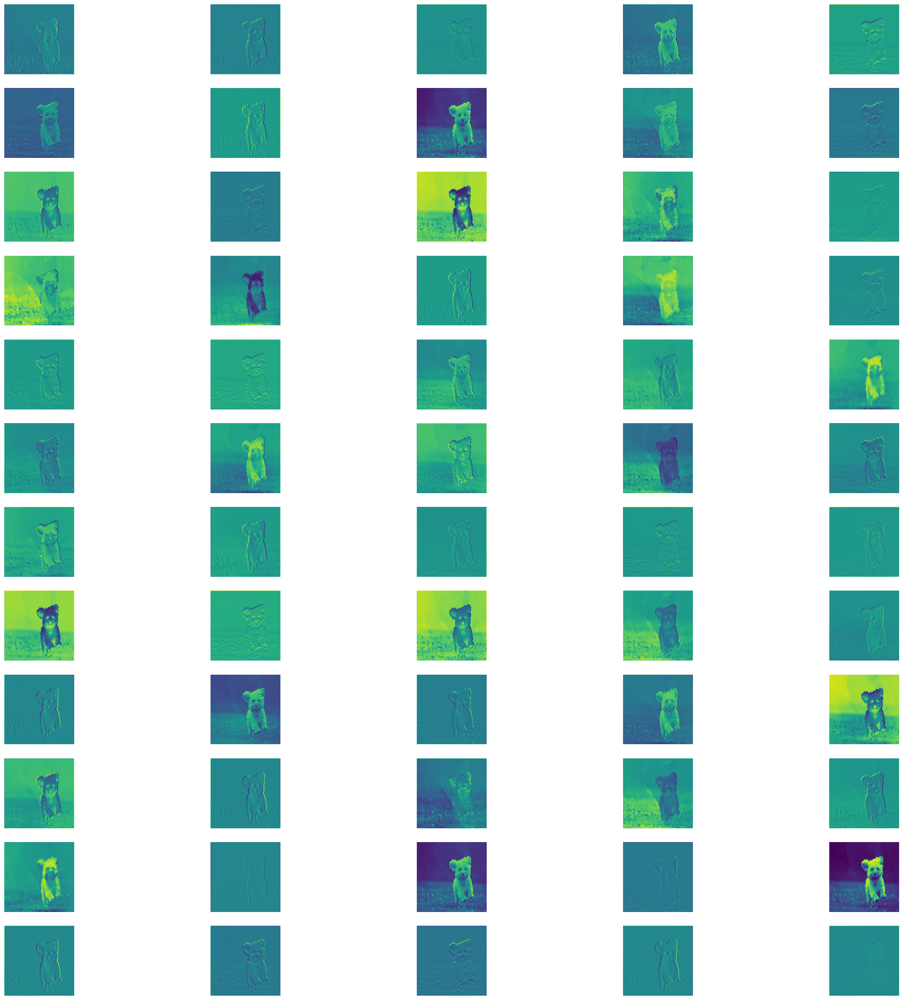

In [ ]:
img = Image.open("dog.jpg")
img = transform(img)
img = img.unsqueeze(0)

activation_maps = first_conv(img)
with torch.no_grad():
  activation_maps = activation_maps.squeeze().numpy()

# Plotting
ncols=5
fig, axes = plt.subplots(len(activation_maps)//ncols, ncols, figsize=(30, 30))
axes=axes.flatten()

for idx, ax in enumerate(axes):
    ax.imshow(activation_maps[idx], cmap='viridis')
    ax.axis('off')

plt.show()

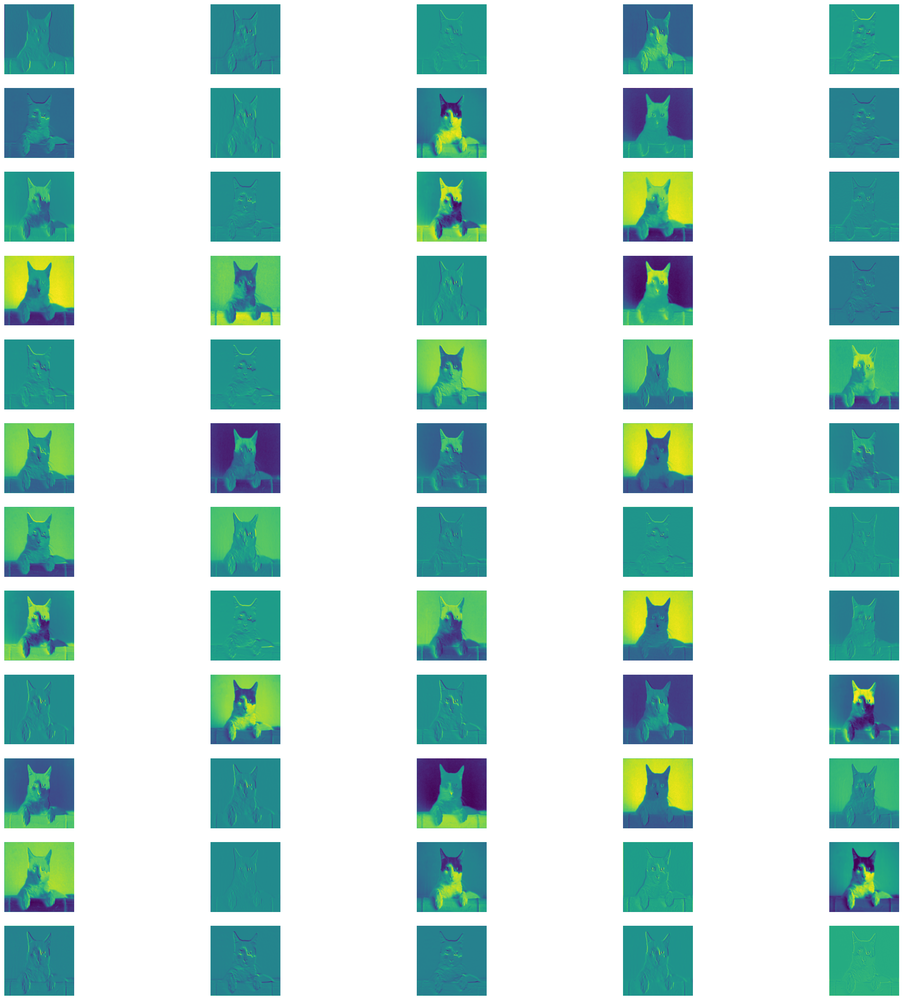

In [ ]:
img = Image.open("cat.jpg")
img = transform(img)
img = img.unsqueeze(0)

activation_maps = first_conv(img)
with torch.no_grad():
  activation_maps = activation_maps.squeeze().numpy()

# Plotting
ncols=5
fig, axes = plt.subplots(len(activation_maps)//ncols, ncols, figsize=(30, 30))
axes=axes.flatten()

for idx, ax in enumerate(axes):
    ax.imshow(activation_maps[idx], cmap='viridis')
    ax.axis('off')

plt.show()

##### second conv

In [ ]:
second_conv=vgg16.features[:2]

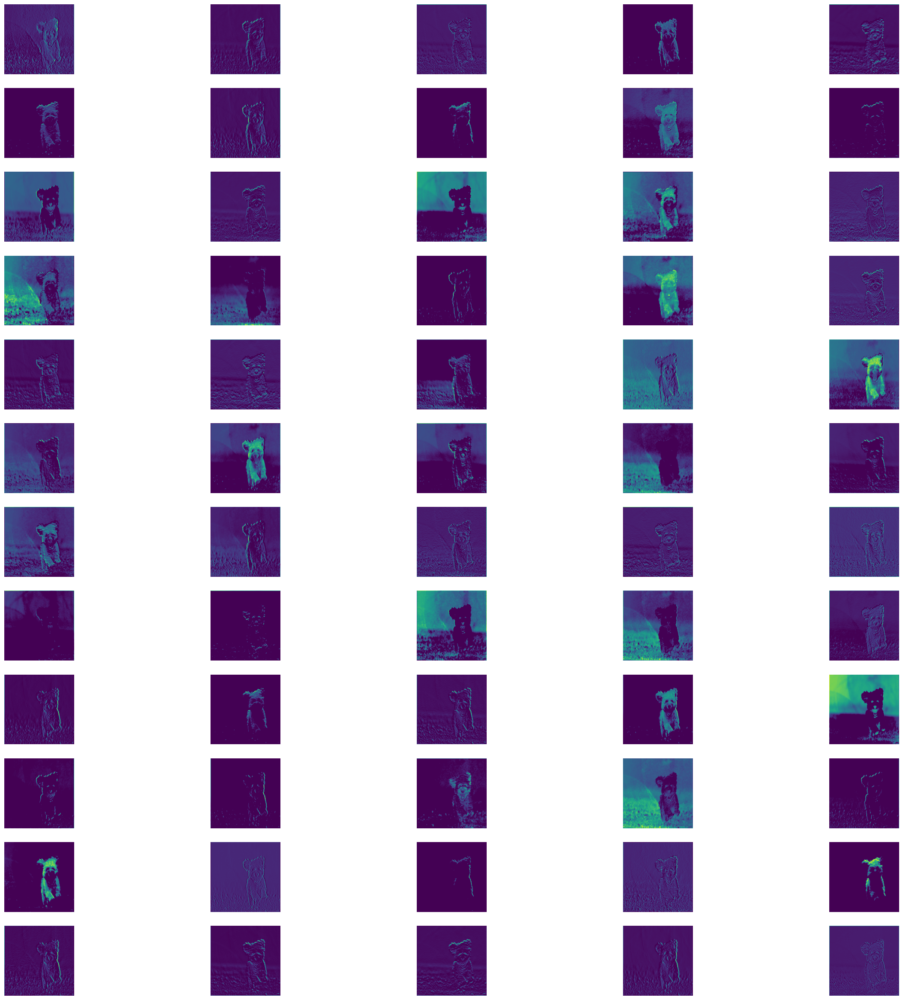

In [ ]:
img = Image.open("dog.jpg")
img = transform(img)
img = img.unsqueeze(0)

activation_maps = second_conv(img)
with torch.no_grad():
  activation_maps = activation_maps.squeeze().numpy()

# Plotting
ncols=5
fig, axes = plt.subplots(len(activation_maps)//ncols, ncols, figsize=(30, 30))
axes=axes.flatten()

for idx, ax in enumerate(axes):
    ax.imshow(activation_maps[idx], cmap='viridis')
    ax.axis('off')

plt.show()

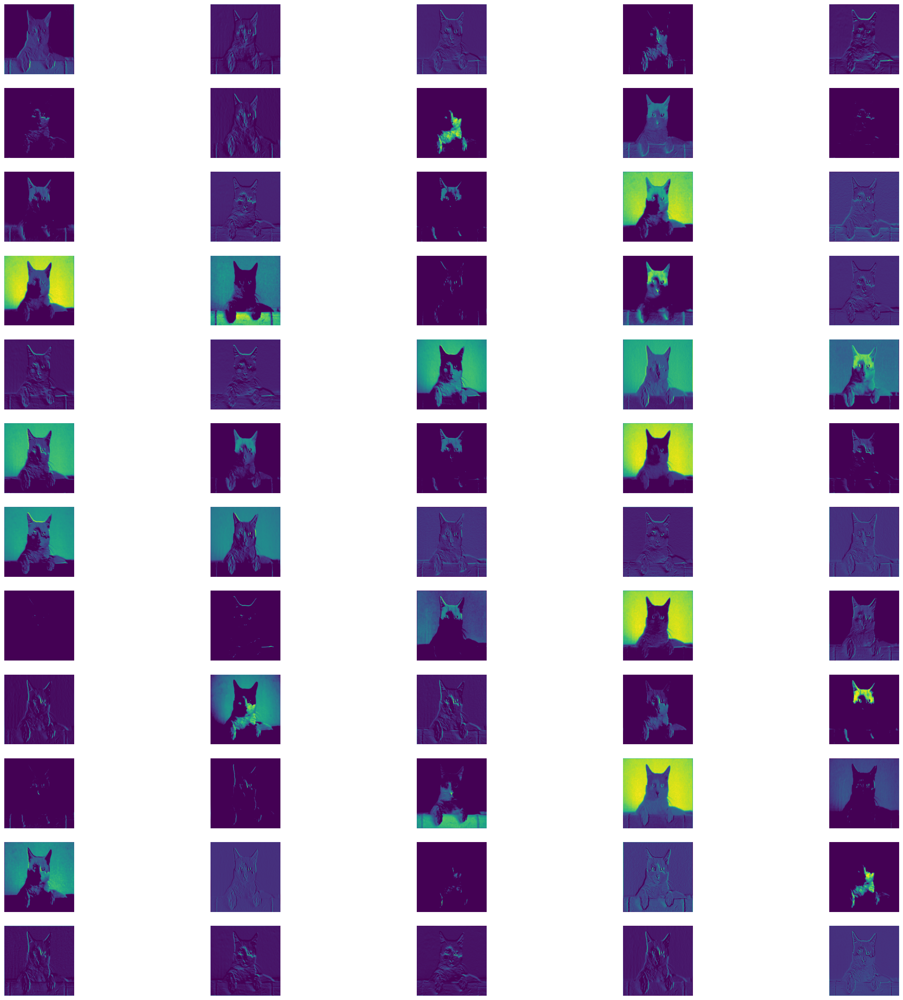

In [ ]:
img = Image.open("cat.jpg")
img = transform(img)
img = img.unsqueeze(0)

activation_maps = second_conv(img)
with torch.no_grad():
  activation_maps = activation_maps.squeeze().numpy()

# Plotting
ncols=5
fig, axes = plt.subplots(len(activation_maps)//ncols, ncols, figsize=(30, 30))
axes=axes.flatten()

for idx, ax in enumerate(axes):
    ax.imshow(activation_maps[idx], cmap='viridis')
    ax.axis('off')

plt.show()

In [ ]:
last_conv= vgg16.features[:-3]

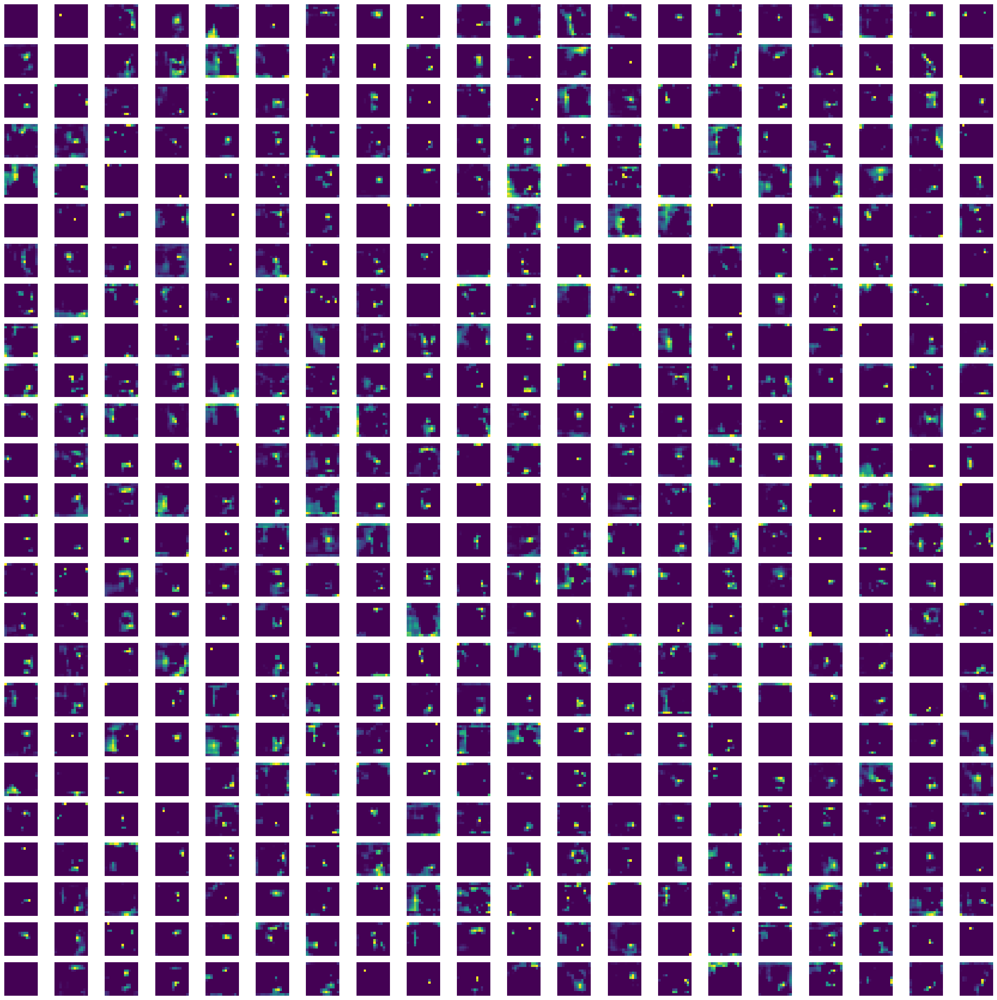

In [ ]:
img = Image.open("dog.jpg")
img = transform(img)
img = img.unsqueeze(0)

activation_maps = last_conv(img)
with torch.no_grad():
  activation_maps = activation_maps.squeeze().numpy()

# Plotting
ncols=20
fig, axes = plt.subplots(len(activation_maps)//ncols, ncols, figsize=(30, 30))
axes=axes.flatten()

for idx, ax in enumerate(axes):
    ax.imshow(activation_maps[idx], cmap='viridis')
    ax.axis('off')

plt.show()

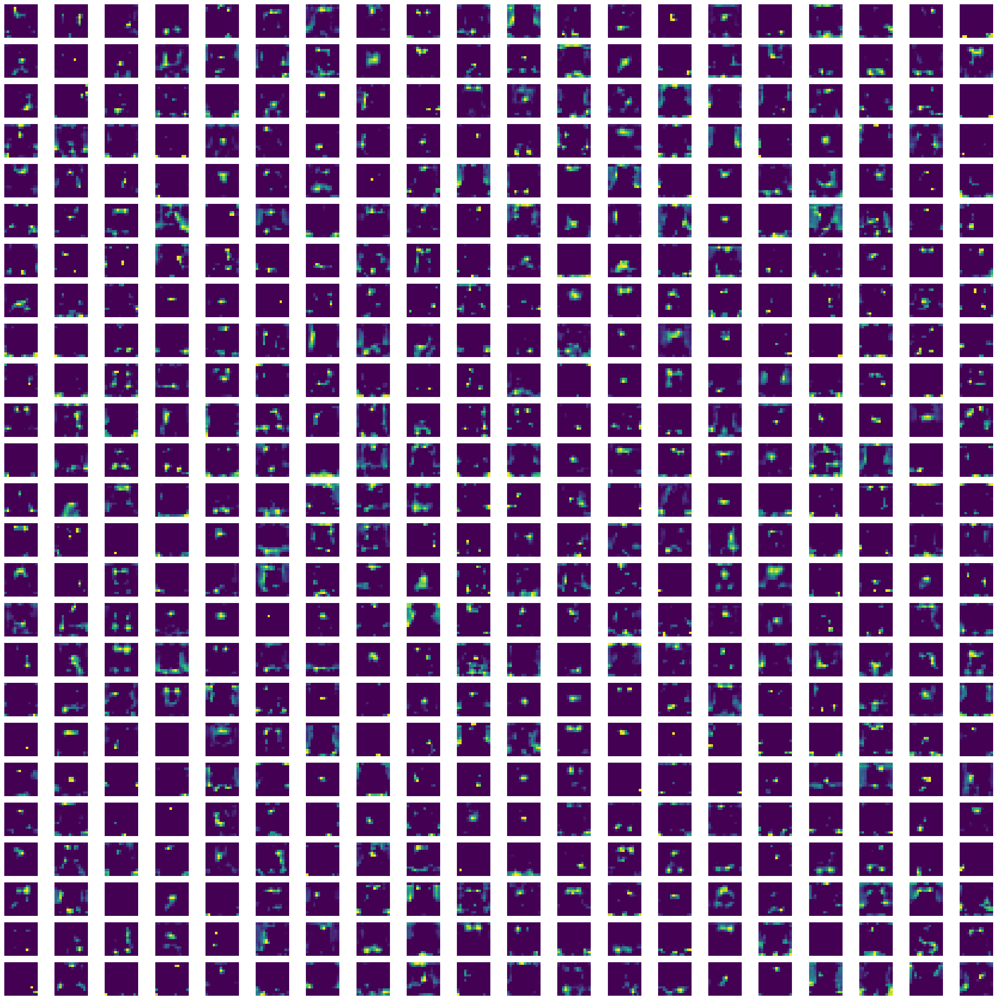

In [ ]:
img = Image.open("cat.jpg")
img = transform(img)
img = img.unsqueeze(0)

activation_maps = last_conv(img)
with torch.no_grad():
  activation_maps = activation_maps.squeeze().numpy()

# Plotting
ncols=20
fig, axes = plt.subplots(len(activation_maps)//ncols, ncols, figsize=(30, 30))
axes=axes.flatten()

for idx, ax in enumerate(axes):
    ax.imshow(activation_maps[idx], cmap='viridis')
    ax.axis('off')

plt.show()

# Partie 2: Transfer Learning avec VGG16 sur 15 Scene

In [ ]:
#!wget https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp8/15ScenesData.zip
!wget https://github.com/rdfia/rdfia.github.io/raw/master/data/3-a/15ScenesData.zip

!unzip 15ScenesData.zip

--2023-12-28 21:31:34--  https://github.com/rdfia/rdfia.github.io/raw/master/data/3-a/15ScenesData.zip
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-a/15ScenesData.zip [following]
--2023-12-28 21:31:34--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-a/15ScenesData.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 86520868 (83M) [application/zip]
Saving to: ‘15ScenesData.zip’

15ScenesData.zip    100%[===================>]  82.51M   377MB/s    in 0.2s    

2023-12-28 21:31:38 (377 MB/s) - ‘15ScenesData.zip’ saved [86520868/86520868]

In [ ]:
ls 15SceneData/test/bedroom/

image_0003.jpg  image_0035.jpg  image_0068.jpg  image_0103.jpg  image_0141.jpg  image_0182.jpg
image_0004.jpg  image_0037.jpg  image_0069.jpg  image_0104.jpg  image_0142.jpg  image_0189.jpg
image_0006.jpg  image_0039.jpg  image_0071.jpg  image_0112.jpg  image_0144.jpg  image_0190.jpg
image_0007.jpg  image_0040.jpg  image_0073.jpg  image_0113.jpg  image_0148.jpg  image_0191.jpg
image_0008.jpg  image_0042.jpg  image_0074.jpg  image_0114.jpg  image_0150.jpg  image_0192.jpg
image_0011.jpg  image_0043.jpg  image_0077.jpg  image_0115.jpg  image_0152.jpg  image_0195.jpg
image_0013.jpg  image_0047.jpg  image_0080.jpg  image_0117.jpg  image_0153.jpg  image_0196.jpg
image_0014.jpg  image_0049.jpg  image_0081.jpg  image_0118.jpg  image_0156.jpg  image_0200.jpg
image_0016.jpg  image_0050.jpg  image_0082.jpg  image_0119.jpg  image_0157.jpg  image_0202.jpg
image_0017.jpg  image_0052.jpg  image_0084.jpg  image_0120.jpg  image_0158.jpg  image_0203.jpg
image_0018.jpg  image_0053.jpg  image_0086.jpg  im

In [ ]:
class VGG16relu7(nn.Module):
  def __init__(self):
    super(VGG16relu7, self).__init__()
    # Copy the entire convolutional part
    self.features = nn.Sequential( *list(vgg16.features.children()))
    # Keep a piece of the classifier: -2 to stop at relu7
    self.classifier = nn.Sequential(*list(vgg16.classifier.children())[:-2])
  def forward(self, x):
    x = self.features(x)
    x = x.view(x.size(0), -1)
    x = self.classifier(x)
    return x


In [ ]:
PRINT_INTERVAL = 50
CUDA = True

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

def get_dataset(batch_size, path):

    # Cette fonction permet de recopier 3 fois une image qui
    # ne serait que sur 1 channel (donc image niveau de gris)
    # pour la "transformer" en image RGB. Utilisez la avec
    # transform.Lambda
    def duplicateChannel(img):
        img = img.convert('L')
        np_img = np.array(img, dtype=np.uint8)
        np_img = np.dstack([np_img, np_img, np_img])
        img = Image.fromarray(np_img, 'RGB')
        return img

    #####################
    ## Votre code ici  ##
    #####################
    # Ajouter le pré-traitement
    train_dataset = datasets.ImageFolder(path+'/train',
        transform=transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=mean, std=std)
        ]))
    val_dataset = datasets.ImageFolder(path+'/test',
        transform=transforms.Compose([ # Pré-traitement à faire
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=mean, std=std)


        ]))
    ####################
    ##      FIN        #
    ####################

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=CUDA, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=CUDA, num_workers=2)

    return train_loader, val_loader

In [ ]:
def extract_features(data, model):
    #####################
    ## Votre code ici  ##
    #####################
    # init features matrices
    features_list = []
    labels_list = []
    ####################
    ##      FIN        #
    ####################

    for i, (input, target) in enumerate(data):
        if i % PRINT_INTERVAL == 0:
            print('Batch {0:03d}/{1:03d}'.format(i, len(data)))
        if CUDA:
            input = input.cuda()
            target = target.cuda()
        #####################
        ## Votre code ici  ##
        #####################
        # Forward pass to extract features
        output_features = model(input)
        output_features = F.normalize(output_features)
        # Detach the features and labels from the GPU and move to CPU, if needed
        output_features = output_features.cpu().detach().numpy()
        target = target.cpu().detach().numpy()

        # Append features and labels to lists
        features_list.append(output_features)
        labels_list.append(target)
    X = np.concatenate(features_list, axis=0)
    y = np.concatenate(labels_list, axis=0)
        ####################
        ##      FIN        #
        ####################

    return X, y

from sklearn.svm import LinearSVC

def main(path="15SceneData", batch_size=8):
    print('Instanciation de VGG16')
    vgg16 = models.vgg16(pretrained=True)

    print('Instanciation de VGG16relu7')
    #####################
    ## Votre code ici  ##
    #####################
    # Remplacer par le modèle par un réseau tronqué pour faire de la feature extraction
    # On créera une nouvelle classe VGG16relu7 ici
    model = VGG16relu7()
    ####################
    ##      FIN        #
    ####################

    model.eval()
    if CUDA: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()

    # On récupère les données
    print('Récupération des données')
    train, test = get_dataset(batch_size, path)

    # Extraction des features
    print('Feature extraction')
    X_train, y_train = extract_features(train, model)
    X_test, y_test = extract_features(test, model)

    #####################
    ## Votre code ici  ##
    #####################
    # Apprentissage et évaluation des SVM à faire

    svm = LinearSVC(C=1.0)
    svm.fit(X_train, y_train)
    print('Apprentissage des SVM')
    accuracy = svm.score(X_test, y_test)
    ####################
    ##      FIN        #
    ####################
    print('Accuracy = %f' % accuracy)


In [ ]:
main("15SceneData", 8)

Instanciation de VGG16
Instanciation de VGG16relu7
Récupération des données
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
Apprentissage des SVM
Accuracy = 0.888107


### Going Further

In [ ]:
import argparse
import os
import time

import PIL
from PIL import Image

import numpy as np
import torchvision
import pickle

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.utils.data
import torchvision.datasets as datasets
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torch.autograd import Variable
import torch.nn.functional as F
from sklearn.svm import LinearSVC
from torch.utils.data import DataLoader

from sklearn.decomposition import PCA
from sklearn.svm import SVC

In [ ]:
vgg16 = torchvision.models.vgg16(pretrained=True)
vgg16.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:10<00:00, 52.9MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
class VGG16mod(nn.Module):
  def __init__(self, class_layer=2, convo_layer=0):
    super(VGG16mod, self).__init__()
    # Copy the entire convolutional part
    self.convolayer = convo_layer
    if convo_layer != 0 :
      self.features = nn.Sequential( *list(vgg16.features.children())[:-convo_layer])
      print(f'Extracting features from layer: {list(vgg16.features.children())[-convo_layer]}')
    else :
      self.features = nn.Sequential( *list(vgg16.features.children()))
      self.classifier = nn.Sequential(*list(vgg16.classifier.children())[:-class_layer])
      print(f'Extracting features from layer: {list(vgg16.classifier.children())[-class_layer]}')

  def forward(self, x):
      x = self.features(x)
      x = x.view(x.size(0), -1)
      if self.convolayer == 0 :
        x = self.classifier(x)
      return x

In [ ]:

def main(path="15SceneData", batch_size=8, class_layer=3, convo_layer=0, n_components=-1, c_value=1.0):
    start_time = time.time()
    vgg16 = models.vgg16(pretrained=True)
    model = VGG16mod(class_layer, convo_layer)
    model.eval()
    if CUDA: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()

    # On récupère les données
    train, test = get_dataset(batch_size, path)

    # Extraction des features
    X_train, y_train = extract_features(train, model)
    X_test, y_test = extract_features(test, model)

    # Apply PCA for dimensionality reduction if n_components is not -1
    if n_components != -1:
        pca = PCA(n_components=n_components)
        X_train = pca.fit_transform(X_train)
        X_test = pca.transform(X_test)

    # Apprentissage et évaluation des SVM à faire

    svm = LinearSVC(C=c_value)
    svm.fit(X_train, y_train)
    print('Apprentissage des SVM')
    accuracy = svm.score(X_test, y_test)
    execution_time = time.time() - start_time
    return accuracy, execution_time

In [ ]:
PRINT_INTERVAL = 400
CUDA = True

In [ ]:
def run_tests(configurations):
    # Initialize a dictionary to store the results
    results = {}

    # Test each configuration
    for config in configurations:
        acc, exec_time = main("15SceneData", 8, **config)
        pca_status = 'No PCA' if config['n_components'] == -1 else f'PCA with {config["n_components"]} components'
        config_str = f"Class layer: {config['class_layer']}, Convo layer: {config['convo_layer']}, {pca_status}, C: {config['c_value']}"
        results[config_str] = {'Accuracy': acc, 'Execution Time': exec_time}

    # Print the results
    print("Test Results:")
    for setting, result in results.items():
        print(f'{setting} -> Accuracy: {100*result["Accuracy"]:.2f}%, Execution Time: {result["Execution Time"]:.2f} seconds')

    return results


In [ ]:
configurations = [
    {'class_layer': 3, 'convo_layer': 0, 'c_value': 1.0, 'n_components': -1},
    {'class_layer': 6, 'convo_layer': 0, 'c_value': 1.0, 'n_components': -1},
    {'class_layer': 0, 'convo_layer': 1, 'c_value': 1.0, 'n_components': -1},
    {'class_layer': 0, 'convo_layer': 2, 'c_value': 1.0, 'n_components': -1},
]

In [ ]:
test_results = run_tests(configurations)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM
Test Results:
Class layer: 3, Convo layer: 0, No PCA, C: 1.0 -> Accuracy: 88.61%, Execution Time: 36.96 seconds
Class layer: 6, Convo layer: 0, No PCA, C: 1.0 -> Accuracy: 90.92%, Execution Time: 37.11 seconds
Class layer: 0, Convo layer: 1, No PCA, C: 1.0 -> Accuracy: 89.55%, Execution Time: 45.07 seconds
Class layer: 0, Convo layer: 2, No PCA, C: 1.0 -> Accuracy: 87.54%, Execution Time: 191.39 seconds


In [ ]:
configurations = [
    {'class_layer': 6, 'convo_layer': 0, 'c_value': 1.0, 'n_components': 100},
    {'class_layer': 0, 'convo_layer': 1, 'c_value': 1.0, 'n_components': 100},
    {'class_layer': 0, 'convo_layer': 2, 'c_value': 1.0, 'n_components': 100},
]

In [ ]:
test_results = run_tests(configurations)

Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM
Test Results:
Class layer: 6, Convo layer: 0, PCA with 100 components, C: 1.0 -> Accuracy: 90.08%, Execution Time: 37.17 seconds
Class layer: 0, Convo layer: 2, PCA with 100 components, C: 1.0 -> Accuracy: 86.57%, Execution Time: 54.81 seconds


In [ ]:
c_values = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
configurations = []
for c in c_values:
    configurations.append({'class_layer': 6, 'convo_layer': 0, 'c_value': c, 'n_components': -1})
    configurations.append({'class_layer': 0, 'convo_layer': 2, 'c_value': c, 'n_components': 100})

In [ ]:
test_results = run_tests(configurations)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Apprentissage des SVM
Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Apprentissage des SVM
Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Apprentissage des SVM
Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM
Test Results:
Class layer: 6, Convo layer: 0, No PCA, C: 0.001 -> Accuracy: 82.71%, Execution Time: 35.13 seconds
Class layer: 0, Convo layer: 2, PCA with 100 components, C: 0.001 -> Accuracy: 70.65%, Execution Time: 48.35 seconds
Class layer: 6, Convo layer: 0, No PCA, C: 0.01 -> Accuracy: 84.59%, Execution Time: 35.84 seconds
Class layer: 0, Convo layer: 2, PCA with 100 components, C: 0.01 -> Accuracy: 73.53%, Execution Time: 49.53 seconds
Class layer: 6, Convo layer: 0, No PCA, C: 0.1 -> Accuracy: 88.34%, Execution Time: 35.57 seconds
Class layer: 0, Convo layer: 2, PCA with 100 components, C: 0.1 -> Accuracy: 81.17%, Execution Time: 49.08 seconds
Class layer: 6, Convo layer: 0, No PCA, C: 1 -> Accuracy: 90.92%, Execution Time: 36.16 seconds
Class layer: 0, Convo layer: 2, PCA with 100 components, C: 1 -> Accuracy: 86.80%, Execution Time: 48.26 seconds
Class lay

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [ ]:
c_values = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
configurations = []
for c in c_values:
    configurations.append({'class_layer': 6, 'convo_layer': 0, 'c_value': c, 'n_components': -1})
    configurations.append({'class_layer': 0, 'convo_layer': 2, 'c_value': c, 'n_components': 100})

In [ ]:
test_results = run_tests(configurations)

Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting features from layer: ReLU(inplace=True)
Batch 000/188
Batch 000/374
Apprentissage des SVM
Test Results:
Class layer: 6, Convo layer: 0, No PCA, C: 1 -> Accuracy: 90.92%, Execution Time: 36.92 seconds
Class layer: 0, Convo layer: 2, PCA with 100 components, C: 1 -> Accuracy: 86.50%, Execution Time: 47.78 seconds
Class layer: 6, Convo layer: 0, No PCA, C: 2 -> Accuracy: 91.46%, Execution Time: 37.06 seconds
Class layer: 0, Convo layer: 2, PCA with 100 components, C: 2 -> Accuracy: 87.10%, Execution Time: 49.34 seconds
Class layer: 6, Convo layer: 0, No PCA, C: 3 -> Accuracy: 91.52%, Execution Time: 38.15 seconds
Class layer: 0, Convo layer: 2, PCA with 100 components, C: 3 -> Accuracy: 87.40%, Execution Time: 47.79 seconds
Class layer: 6, Convo layer: 0, No PCA, C: 4 -> Accuracy: 91.42%, Execution Time: 38.50 seconds
Class layer: 0, Convo layer: 2, PCA with 100 components, C: 4 -> Accuracy: 87.17%, Execution Time: 48.05 seconds
Class layer: 6, Convo layer: 0, No PCA, C: 5 -> A